# This Python notebook performs one or more steps of robotic disassembly tasks. It is based on the library panda-gym [1,2,3]. The training algorithm is taken from Stable-Baselines3 [4,5]. The Notebook is prepared to run directly on Google Colaboratory using Google Drive for data storage. Hence, only minimum set-up is required. This notebook generates the results of the case "2 Parts and 1 Target" reported in [6].

##[1] GitHub page of panda-gym: https://github.com/qgallouedec/panda-gym/tree/master
##[2] Documentation of panda-gym: https://panda-gym.readthedocs.io/en/latest/
##[3] Gallouédec, Q., Cazin, N., Dellandréa, E. and Chen, L., 2021, December. panda-gym: Open-source goal-conditioned environments for robotic learning. In 4th Robot Learning Workshop: Self-Supervised and Lifelong Learning@ NeurIPS 2021.
## [4] Raffin, A., Hill, A., Gleave, A., Kanervisto, A., Ernestus, M. and Dormann, N., 2021. Stable-baselines3: Reliable reinforcement learning implementations. Journal of machine learning research, 22(268), pp.1-8.
## [5] Documentation of Stable-Baselines3: https://stable-baselines3.readthedocs.io/en/master/  
## [6] Zocco, F. and Malvezzi, M., 2025. CIRO7.2: A material network with circularity of -7.2 and reinforcement-learning-controlled robotic disassembler. arXiv preprint arXiv:2506.11748.

In [ ]:
#Print the type of GPU executing the notebook:

!nvidia-smi -L # 'command not found' indicates that the Notebook is running on one or more CPUs. This command is found only if
               # a GPU is selected from "Runtime => Change runtime type"

GPU 0: NVIDIA L4 (UUID: GPU-885cef37-2f83-bd82-51b3-e2a7a1930851)


In [ ]:
# Import the library to mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## (1) Install and import required packages:

In [ ]:
%pip install panda-gym
!pip install stable-baselines3[extra]
!pip install sb3-contrib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 MB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.5/184.5 kB 21.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitli

## (2) Prepare folder to store the trained agent, logs, etc.:

In [ ]:
import os
os.chdir('drive/MyDrive/Model_agent_logs')
!pwd

/content/drive/MyDrive/Model_agent_logs


In [ ]:
# Create folder to store the logs:

logdir = "logs"

if not os.path.exists(logdir):
  os.makedirs(logdir)

## (3) Modify panda-gym environment and prepare it for training with Stable-Baselines3 (SB3) algorithms:

This part modifies and registers a panda-gym environment as a Gymnasium environment to be compatible with SB3.

In [ ]:
# (a) Define robot class, task class, and superclass to combine them:
# Source: https://github.com/qgallouedec/panda-gym/blob/master/panda_gym/envs/core.py


from abc import ABC, abstractmethod
from typing import Any, Dict, Optional, Tuple

import gymnasium as gym
import numpy as np
from gymnasium import spaces
from gymnasium.utils import seeding

from panda_gym.pybullet import PyBullet


class PyBulletRobot(ABC):
    """Base class for robot env.

    Args:
        sim (PyBullet): Simulation instance.
        body_name (str): The name of the robot within the simulation.
        file_name (str): Path of the urdf file.
        base_position (np.ndarray): Position of the base of the robot as (x, y, z).
    """

    def __init__(
        self,
        sim: PyBullet,
        body_name: str,
        file_name: str,
        base_position: np.ndarray,
        action_space: spaces.Space,
        joint_indices: np.ndarray,
        joint_forces: np.ndarray,
    ) -> None:
        self.sim = sim
        self.body_name = body_name
        with self.sim.no_rendering():
            self._load_robot(file_name, base_position)
            self.setup()
        self.action_space = action_space
        self.joint_indices = joint_indices
        self.joint_forces = joint_forces

    def _load_robot(self, file_name: str, base_position: np.ndarray) -> None:
        """Load the robot.

        Args:
            file_name (str): The URDF file name of the robot.
            base_position (np.ndarray): The position of the robot, as (x, y, z).
        """
        self.sim.loadURDF(
            body_name=self.body_name,
            fileName=file_name,
            basePosition=base_position,
            useFixedBase=True,
        )

    def setup(self) -> None:
        """Called after robot loading."""
        pass

    @abstractmethod
    def set_action(self, action: np.ndarray) -> None:
        """Set the action. Must be called just before sim.step().

        Args:
            action (np.ndarray): The action.
        """

    @abstractmethod
    def get_obs(self) -> np.ndarray:
        """Return the observation associated to the robot.

        Returns:
            np.ndarray: The observation.
        """

    @abstractmethod
    def reset(self) -> None:
        """Reset the robot and return the observation."""

    def get_link_position(self, link: int) -> np.ndarray:
        """Returns the position of a link as (x, y, z)

        Args:
            link (int): The link index.

        Returns:
            np.ndarray: Position as (x, y, z)
        """
        return self.sim.get_link_position(self.body_name, link)

    def get_link_velocity(self, link: int) -> np.ndarray:
        """Returns the velocity of a link as (vx, vy, vz)

        Args:
            link (int): The link index.

        Returns:
            np.ndarray: Velocity as (vx, vy, vz)
        """
        return self.sim.get_link_velocity(self.body_name, link)

    def get_joint_angle(self, joint: int) -> float:
        """Returns the angle of a joint

        Args:
            joint (int): The joint index.

        Returns:
            float: Joint angle
        """
        return self.sim.get_joint_angle(self.body_name, joint)

    def get_joint_velocity(self, joint: int) -> float:
        """Returns the velocity of a joint as (wx, wy, wz)

        Args:
            joint (int): The joint index.

        Returns:
            np.ndarray: Joint velocity as (wx, wy, wz)
        """
        return self.sim.get_joint_velocity(self.body_name, joint)

    def control_joints(self, target_angles: np.ndarray) -> None:
        """Control the joints of the robot.

        Args:
            target_angles (np.ndarray): The target angles. The length of the array must equal to the number of joints.
        """
        self.sim.control_joints(
            body=self.body_name,
            joints=self.joint_indices,
            target_angles=target_angles,
            forces=self.joint_forces,
        )

    def set_joint_angles(self, angles: np.ndarray) -> None:
        """Set the joint position of a body. Can induce collisions.

        Args:
            angles (list): Joint angles.
        """
        self.sim.set_joint_angles(self.body_name, joints=self.joint_indices, angles=angles)

    def inverse_kinematics(self, link: int, position: np.ndarray, orientation: np.ndarray) -> np.ndarray:
        """Compute the inverse kinematics and return the new joint values.

        Args:
            link (int): The link.
            position (x, y, z): Desired position of the link.
            orientation (x, y, z, w): Desired orientation of the link.

        Returns:
            List of joint values.
        """
        inverse_kinematics = self.sim.inverse_kinematics(self.body_name, link=link, position=position, orientation=orientation)
        return inverse_kinematics


class Task(ABC):
    """Base class for tasks.
    Args:
        sim (PyBullet): Simulation instance.
    """

    def __init__(self, sim: PyBullet) -> None:
        self.sim = sim
        self.goal = None

    @abstractmethod
    def reset(self) -> None:
        """Reset the task: sample a new goal."""

    @abstractmethod
    def get_obs(self) -> np.ndarray:
        """Return the observation associated to the task."""

    @abstractmethod
    def get_achieved_goal(self) -> np.ndarray:
        """Return the achieved goal."""

    def get_goal(self) -> np.ndarray:
        """Return the current goal."""
        if self.goal is None:
            raise RuntimeError("No goal yet, call reset() first")
        else:
            return self.goal.copy()

    @abstractmethod
    def is_success(self, achieved_goal: np.ndarray, desired_goal: np.ndarray, info: Dict[str, Any] = {}) -> np.ndarray:
        """Returns whether the achieved goal match the desired goal."""

    @abstractmethod
    def compute_reward(self, achieved_goal: np.ndarray, desired_goal: np.ndarray, info: Dict[str, Any] = {}) -> np.ndarray:
        """Compute reward associated to the achieved and the desired goal."""


class RobotTaskEnv(gym.Env):
    """Robotic task goal env, as the junction of a task and a robot.

    Args:
        robot (PyBulletRobot): The robot.
        task (Task): The task.
        render_width (int, optional): Image width. Defaults to 720.
        render_height (int, optional): Image height. Defaults to 480.
        render_target_position (np.ndarray, optional): Camera targeting this position, as (x, y, z).
            Defaults to [0., 0., 0.].
        render_distance (float, optional): Distance of the camera. Defaults to 1.4.
        render_yaw (float, optional): Yaw of the camera. Defaults to 45.
        render_pitch (float, optional): Pitch of the camera. Defaults to -30.
        render_roll (int, optional): Roll of the camera. Defaults to 0.
    """

    metadata = {"render_modes": ["human", "rgb_array"]}

    def __init__(
        self,
        robot: PyBulletRobot,
        task: Task,
        render_width: int = 720,
        render_height: int = 480,
        render_target_position: Optional[np.ndarray] = None,
        render_distance: float = 1.4,
        render_yaw: float = 45,
        render_pitch: float = -30,
        render_roll: float = 0,
    ) -> None:
        assert robot.sim == task.sim, "The robot and the task must belong to the same simulation."
        self.sim = robot.sim
        self.render_mode = self.sim.render_mode
        self.metadata["render_fps"] = 1 / self.sim.dt
        self.robot = robot
        self.task = task
        observation, _ = self.reset()  # required for init; seed can be changed later
        observation_shape = observation["observation"].shape
        achieved_goal_shape = observation["achieved_goal"].shape
        desired_goal_shape = observation["desired_goal"].shape
        self.observation_space = spaces.Dict(
            dict(
                observation=spaces.Box(-10.0, 10.0, shape=observation_shape, dtype=np.float32),
                desired_goal=spaces.Box(-10.0, 10.0, shape=desired_goal_shape, dtype=np.float32),
                achieved_goal=spaces.Box(-10.0, 10.0, shape=achieved_goal_shape, dtype=np.float32),
            )
        )
        self.action_space = self.robot.action_space
        self.compute_reward = self.task.compute_reward
        self._saved_goal = dict()  # For state saving and restoring

        self.render_width = render_width
        self.render_height = render_height
        self.render_target_position = (
            render_target_position if render_target_position is not None else np.array([0.0, 0.0, 0.0])
        )
        self.render_distance = render_distance
        self.render_yaw = render_yaw
        self.render_pitch = render_pitch
        self.render_roll = render_roll
        with self.sim.no_rendering():
            self.sim.place_visualizer(
                target_position=self.render_target_position,
                distance=self.render_distance,
                yaw=self.render_yaw,
                pitch=self.render_pitch,
            )

    def _get_obs(self) -> Dict[str, np.ndarray]:
        robot_obs = self.robot.get_obs().astype(np.float32)  # robot state
        task_obs = self.task.get_obs().astype(np.float32)  # object position, velocity, etc...
        observation = np.concatenate([robot_obs, task_obs])
        achieved_goal = self.task.get_achieved_goal().astype(np.float32)
        return {
            "observation": observation,
            "achieved_goal": achieved_goal,
            "desired_goal": self.task.get_goal().astype(np.float32),
        }

    def reset(
        self, seed: Optional[int] = None, options: Optional[dict] = None
    ) -> Tuple[Dict[str, np.ndarray], Dict[str, Any]]:
        super().reset(seed=seed, options=options)
        self.task.np_random = self.np_random
        with self.sim.no_rendering():
            self.robot.reset()
            self.task.reset()
        observation = self._get_obs()
        info = {"is_success": self.task.is_success(observation["achieved_goal"], self.task.get_goal())}
        return observation, info

    def save_state(self) -> int:
        """Save the current state of the environment. Restore with `restore_state`.

        Returns:
            int: State unique identifier.
        """
        state_id = self.sim.save_state()
        self._saved_goal[state_id] = self.task.goal
        return state_id

    def restore_state(self, state_id: int) -> None:
        """Restore the state associated with the unique identifier.

        Args:
            state_id (int): State unique identifier.
        """
        self.sim.restore_state(state_id)
        self.task.goal = self._saved_goal[state_id]

    def remove_state(self, state_id: int) -> None:
        """Remove a saved state.

        Args:
            state_id (int): State unique identifier.
        """
        self._saved_goal.pop(state_id)
        self.sim.remove_state(state_id)

    def step(self, action: np.ndarray) -> Tuple[Dict[str, np.ndarray], float, bool, bool, Dict[str, Any]]:
        self.robot.set_action(action)
        self.sim.step()
        observation = self._get_obs()
        # An episode is terminated iff the agent has reached the target
        terminated = bool(self.task.is_success(observation["achieved_goal"], self.task.get_goal()))
        truncated = False
        info = {"is_success": terminated}
        reward = float(self.task.compute_reward(observation["achieved_goal"], self.task.get_goal(), info))
        return observation, reward, terminated, truncated, info

    def close(self) -> None:
        self.sim.close()

    def render(self) -> Optional[np.ndarray]:
        """Render.

        If render mode is "rgb_array", return an RGB array of the scene. Else, do nothing and return None.

        Returns:
            RGB np.ndarray or None: An RGB array if mode is 'rgb_array', else None.
        """
        return self.sim.render(
            width=self.render_width,
            height=self.render_height,
            target_position=self.render_target_position,
            distance=self.render_distance,
            yaw=self.render_yaw,
            pitch=self.render_pitch,
            roll=self.render_roll,
        )

In [ ]:
# (b) Class for pick-and-place task:
# Source: https://github.com/qgallouedec/panda-gym/blob/master/panda_gym/envs/tasks/pick_and_place.py

# MODIFICATION: adaptation of the panda-gym class to perform the case of "2 Parts and 1 Target" in [6] (see list of references at the beginning of this notebook).


from typing import Any, Dict

import numpy as np

from panda_gym.envs.core import Task
from panda_gym.pybullet import PyBullet
from panda_gym.utils import distance


class PickAndPlace(Task):
    def __init__(
        self,
        sim: PyBullet,
        reward_type: str = "sparse",
        distance_threshold: float = 0.05,
        goal_xy_range: float = 0.3,
        goal_z_range: float = 0.0, # the targets are on the table
        obj_xy_range: float = 0.3, # used for random initialization of the position of part_1
    ) -> None:
        super().__init__(sim)
        self.reward_type = reward_type
        self.distance_threshold = distance_threshold
        self.object_size = 0.04
        self.goal_range_low = np.array([-goal_xy_range / 2, -goal_xy_range / 2, 0])
        self.goal_range_high = np.array([goal_xy_range / 2, goal_xy_range / 2, goal_z_range])
        self.obj_range_low = np.array([-obj_xy_range / 2, -obj_xy_range / 2, 0])
        self.obj_range_high = np.array([obj_xy_range / 2, obj_xy_range / 2, 0])
        with self.sim.no_rendering():
            self._create_scene()

    def _create_scene(self) -> None:
        """Create the scene."""
        self.sim.create_plane(z_offset=-0.4)
        self.sim.create_table(length=1.1, width=0.7, height=0.4, x_offset=-0.3)
        self.sim.create_box(
            body_name="part_2", # part at the bottom
            half_extents=np.ones(3) * self.object_size / 2,
            mass=1.0,
            position=np.array([0.0, 0.0, self.object_size / 2]),
            rgba_color=np.array([1.0, 0.0, 0.0, 1.0]),
        )
        self.sim.create_box(
            body_name="part_1", # part at the top
            half_extents=np.ones(3) * self.object_size / 2,
            mass=1.0,
            position=np.array([0.0, 0.0, (self.object_size / 2) + self.object_size]),
            rgba_color=np.array([0.0, 1.0, 0.0, 1.0]),
        )
        self.sim.create_sphere(
            body_name="target_1",
            radius = self.object_size / 2,
            mass=0.0,
            ghost=True,
            position=np.array([0.0, 0.0, 0.05]),
            rgba_color=np.array([0.0, 1.0, 0.0, 0.2]),
        )

    def get_obs(self) -> np.ndarray:
        # position, rotation of part_1
        object_position = self.sim.get_base_position("part_1")
        object_rotation = self.sim.get_base_rotation("part_1")
        object_velocity = self.sim.get_base_velocity("part_1")
        object_angular_velocity = self.sim.get_base_angular_velocity("part_1")
        observation = np.concatenate([object_position, object_rotation, object_velocity, object_angular_velocity])
        return observation

    def get_achieved_goal(self) -> np.ndarray:
        object_position = np.array(self.sim.get_base_position("part_1"))
        return object_position

    def reset(self) -> None:
        self.goal = self._sample_goal()
        object_position = self._sample_object()
        self.sim.set_base_pose("target_1", self.goal, np.array([0.0, 0.0, 0.0, 0.05]))
        self.sim.set_base_pose("part_1", object_position, np.array([0.0, 0.0, 0.0, 1.0]))
        self.sim.set_base_pose("part_2", object_position - np.array([0.0, 0.0, self.object_size]), np.array([0.0, 0.0, 0.0, 1.0])) # part_2 is always under part_1

    def _sample_goal(self) -> np.ndarray:
        """Sample a goal."""
        goal = np.array([-0.2, 0.25, self.object_size / 2])  # fixed position of target_1
        #noise = self.np_random.uniform(self.goal_range_low, self.goal_range_high)
        #if self.np_random.random() < 0.3:
        #    noise[2] = 0.0
        #goal += noise
        return goal

    def _sample_object(self) -> np.ndarray:
        """Randomize start position of parts."""
        object_position = np.array([0.0, 0.0, self.object_size / 2 + self.object_size])
        noise = self.np_random.uniform(self.obj_range_low, self.obj_range_high)
        object_position += noise # x and y are random, z is fixed
        return object_position

    def is_success(self, achieved_goal: np.ndarray, desired_goal: np.ndarray, info: Dict[str, Any] = {}) -> np.ndarray:
        d = distance(achieved_goal, desired_goal)
        return np.array(d < self.distance_threshold, dtype=bool)

    def compute_reward(self, achieved_goal: np.ndarray, desired_goal: np.ndarray, info: Dict[str, Any] = {}) -> np.ndarray:
        d = distance(achieved_goal, desired_goal)
        if self.reward_type == "sparse":
            return -np.array(d > self.distance_threshold, dtype=np.float32)
        else:
            return -d.astype(np.float32)

In [ ]:
# (c) Class environment to be used in "entry_point" for the registration in Gymnasium:
# Source: https://github.com/qgallouedec/panda-gym/blob/master/panda_gym/envs/panda_tasks.py

# MODIFICATIONS: (1) removed all the imports from 'panda_gym.envs' since those modules are in previous cells of this notebook


from typing import Optional
import numpy as np

from panda_gym.envs.robots.panda import Panda
from panda_gym.pybullet import PyBullet

class PandaDisas2P1TEnv(RobotTaskEnv):
    """

    Args:
        render_mode (str, optional): Render mode. Defaults to "rgb_array".
        reward_type (str, optional): "sparse" or "dense". Defaults to "sparse".
        control_type (str, optional): "ee" to control end-effector position or "joints" to control joint values.
            Defaults to "ee".
        renderer (str, optional): Renderer, either "Tiny" or OpenGL". Defaults to "Tiny" if render mode is "human"
            and "OpenGL" if render mode is "rgb_array". Only "OpenGL" is available for human render mode.
        render_width (int, optional): Image width. Defaults to 720.
        render_height (int, optional): Image height. Defaults to 480.
        render_target_position (np.ndarray, optional): Camera targeting this position, as (x, y, z).
            Defaults to [0., 0., 0.].
        render_distance (float, optional): Distance of the camera. Defaults to 1.4.
        render_yaw (float, optional): Yaw of the camera. Defaults to 45.
        render_pitch (float, optional): Pitch of the camera. Defaults to -30.
        render_roll (int, optional): Roll of the camera. Defaults to 0.
    """

    def __init__(
        self,
        render_mode: str = "rgb_array",
        reward_type: str = "sparse",
        control_type: str = "ee",
        renderer: str = "Tiny",
        render_width: int = 720,
        render_height: int = 480,
        render_target_position: Optional[np.ndarray] = None,
        render_distance: float = 1.4,
        render_yaw: float = 45,
        render_pitch: float = -30,
        render_roll: float = 0,
    ) -> None:
        sim = PyBullet(render_mode=render_mode, renderer=renderer)
        robot = Panda(sim, block_gripper=False, base_position=np.array([-0.6, 0.0, 0.0]), control_type=control_type)
        task = PickAndPlace(sim, reward_type=reward_type)
        super().__init__(
            robot,
            task,
            render_width=render_width,
            render_height=render_height,
            render_target_position=render_target_position,
            render_distance=render_distance,
            render_yaw=render_yaw,
            render_pitch=render_pitch,
            render_roll=render_roll,
        )


In [ ]:
# (d) Register the new environment in Gymnasium:
# Source: https://github.com/qgallouedec/panda-gym/blob/master/panda_gym/__init__.py

# MODIFICATIONS:  (1) commented-out the first line
#                 (2) added task "Disas2P1T"


import os
from gymnasium.envs.registration import register

#with open(os.path.join(os.path.dirname(__file__), "version.txt"), "r") as file_handler:
#    __version__ = file_handler.read().strip()

ENV_IDS = []

for task in ["Disas2P1T"]:
    for reward_type in ["sparse", "dense"]:
        for control_type in ["ee", "joints"]:
            reward_suffix = "Dense" if reward_type == "dense" else ""
            control_suffix = "Joints" if control_type == "joints" else ""
            env_id = f"Panda{task}{control_suffix}{reward_suffix}-v1"

            register(
                id=env_id,
                entry_point=f"__main__:Panda{task}Env",  # '__main__' indicates that the module is embedded in a previous cell of this notebook
                kwargs={"reward_type": reward_type, "control_type": control_type},
                max_episode_steps=100 if task == "Stack" else 50,
            )

            ENV_IDS.append(env_id)

## (4) Now we can use an SB3 algorithm on the *custom* environment:

In [ ]:
# Choose and load SB3 training algorithm:
from stable_baselines3 import HerReplayBuffer
from stable_baselines3 import TD3

In [ ]:
# Instantiate the environment:

env = gym.make("PandaDisas2P1T-v1", render_mode="rgb_array")

In [ ]:
# Instantiate RL agent/controller:

# For this environment, modify the architecture of the fully-connected network predicting action and value (i.e., the actor and critic networks)
import torch as th
policy_kwargs = dict(n_critics=2, net_arch=[512, 512, 512])

model = TD3(
    "MultiInputPolicy",
    env,
    verbose=1,
    policy_kwargs=policy_kwargs,
    tensorboard_log=logdir,
    # Add HER (details at: https://stable-baselines3.readthedocs.io/en/master/modules/her.html)
    replay_buffer_class=HerReplayBuffer,
    replay_buffer_kwargs=dict(
        n_sampled_goal=4,
        goal_selection_strategy="future",
    ),
)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


In [ ]:
# Train and save the agent:

model.learn(total_timesteps=4.5*10**5, progress_bar=True)
model.save("PandaDisas2P1T_TD3-HER")

Logging to logs/TD3_1


Output()

/usr/local/lib/python3.11/dist-packages/ipywidgets/widgets/widget_output.py:111: DeprecationWarning: 
Kernel._parent_header is deprecated in ipykernel 6. Use .get_parent()
  if ip and hasattr(ip, 'kernel') and hasattr(ip.kernel, '_parent_header'):

Streaming output truncated to the last 5000 lines.
|    time_elapsed    | 5090     |
|    total_timesteps | 387600   |
| train/             |          |
|    actor_loss      | 76.7     |
|    critic_loss     | 62.6     |
|    learning_rate   | 0.001    |
|    n_updates       | 387499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -50      |
|    success_rate    | 0        |
| time/              |          |
|    episodes        | 7756     |
|    fps             | 76       |
|    time_elapsed    | 5093     |
|    total_timesteps | 387800   |
| train/             |          |
|    actor_loss      | 70.9     |
|    critic_loss     | 13.8     |
|    learning_rate   | 0.001    |
|    n_updates       | 387699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 50       |
|    ep_rew_mean     | -50     

In [ ]:
# Load the saved agent:

model = TD3.load("PandaDisas2P1T_TD3-HER", env=env)

Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


## (5) Analysis of performance:

In [ ]:
# (a) Load the TensorBoard Notebook extension and use it to plot the training logs:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

episodes left:  9
episodes left:  8
episodes left:  7
episodes left:  6
episodes left:  5
episodes left:  4
episodes left:  3
episodes left:  2
episodes left:  1
episodes left:  0
counter_of_successes 0
counter_of_timesteps 500
Percentage success:  0.0
Disassembly time:  2.0


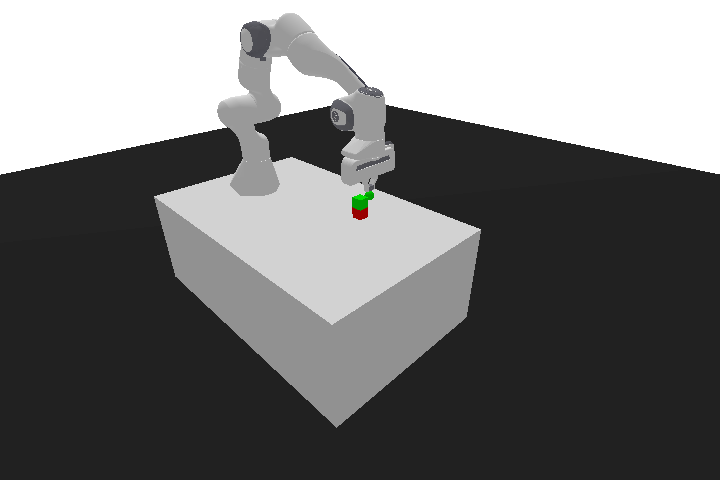

In [ ]:
# (b) Qualitative analysis of the trained agent using a video:

import gymnasium as gym
import panda_gym


simulated_episodes = 10
episodes_left = simulated_episodes


eval_env = gym.make("PandaDisas2P1T-v1", render_mode="rgb_array")
observations, info = eval_env.reset()

images = [eval_env.render()]
counter_of_successes = 0  # to calculate the percentage success "s"
counter_of_timesteps = 0

while episodes_left > 0:
    action, _ = model.predict(observations)
    observations, reward, terminated, truncated, info = eval_env.step(action)
    images.append(eval_env.render())

    counter_of_timesteps += 1 # count how many timesteps are executed

    # To calculate the percentage success "s":
    if terminated:
      counter_of_successes += 1  # i.e., number of terminations


    if terminated or truncated:
        observations, info = eval_env.reset()
        episodes_left -= 1 # end of an episode
        print("episodes left: ", episodes_left)
        images.append(eval_env.render())

eval_env.close()

print("counter_of_successes", counter_of_successes)
print("counter_of_timesteps", counter_of_timesteps)

s = (counter_of_successes/simulated_episodes)*100  # percentage success
print("Percentage success: ", s)

# Disassembly time "T_d":
mean_length_per_episode = counter_of_timesteps/simulated_episodes
T_d = 40*mean_length_per_episode/1000  # in seconds; "40" is taken from the panda-gym paper of Gallouédec et al.
print("Disassembly time: ", T_d)


## Convert into animation:
%pip install numpngw
from numpngw import write_apng

write_apng("anim.png", images, delay=40)  # real-time rendering = 40 ms between frames


## Show animation:
from IPython.display import Image
Image(filename="anim.png")